# **E-1**

##Imports & Setup

In [36]:
import os, glob, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from PIL import Image
from scipy.ndimage import uniform_filter
from skimage import filters, measure, morphology, feature, color, exposure
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.feature import graycomatrix, graycoprops
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')
np.random.seed(42)
plt.rcParams.update({'figure.dpi': 120, 'axes.titlesize': 10})
print("All libraries imported successfully")


All libraries imported successfully


##  Batch Processing — Load Entire Image Folder

You must authenticate before you can call the Kaggle API.
Follow the instructions to authenticate at: https://github.com/Kaggle/kaggle-cli/blob/main/docs/README.md#authentication
  './melanoma_dataset' not found — generating synthetic melanoma images.
 Generated 60 synthetic images (30 malignant + 30 benign)


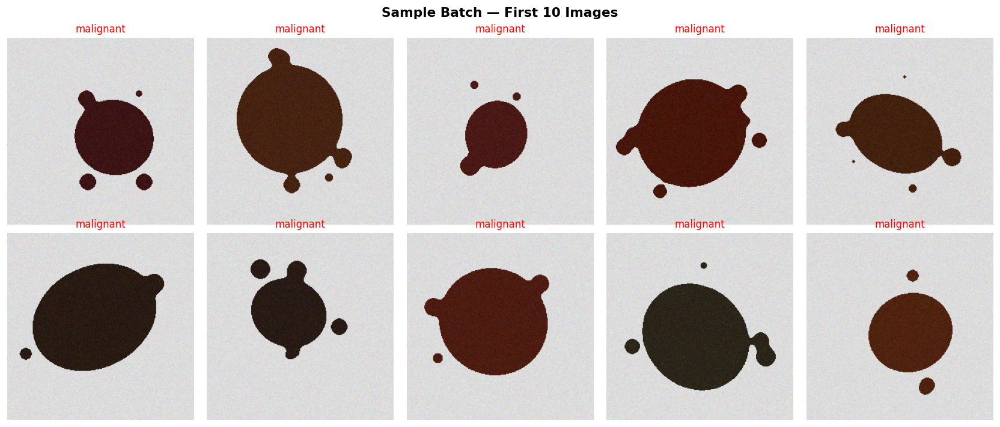

Label distribution: {np.str_('benign'): np.int64(30), np.str_('malignant'): np.int64(30)}


In [37]:
# Dataset path
!kaggle kernels pull aristarhbfg/melanoma-dataset
DATASET_DIR = "./melanoma_dataset"
SUPPORTED_EXTS = ("*.jpg", "*.jpeg", "*.png", "*.bmp", "*.tif", "*.tiff")

def load_images_batch(folder, max_images=60):
    """Load all images from a folder (batch processing)."""
    paths = []
    for ext in SUPPORTED_EXTS:
        paths.extend(glob.glob(os.path.join(folder, "**", ext), recursive=True))
    paths = sorted(paths)[:max_images]
    images, filenames, labels = [], [], []
    for p in paths:
        img = cv2.imread(p)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        images.append(img)
        filenames.append(os.path.basename(p))
        # Infer label from folder name  (melanoma / benign / nevus …)
        parent = os.path.basename(os.path.dirname(p)).lower()
        label = "malignant" if any(k in parent for k in ("melanoma","malignant","cancer")) else "benign"
        labels.append(label)
    return images, filenames, labels

# Synthetic fallback (runs when Kaggle data is absent)
def make_synthetic_melanoma(n=30, size=256, malignant=True):
    imgs = []
    for i in range(n):
        img = np.ones((size, size, 3), dtype=np.uint8) * 220   # skin tone bg
        # Irregular dark lesion
        center = (size//2 + np.random.randint(-20,20),
                  size//2 + np.random.randint(-20,20))
        r = np.random.randint(40, 80) if malignant else np.random.randint(25, 45)
        mask = np.zeros((size, size), dtype=np.uint8)
        cv2.ellipse(mask, center,
                    (r + np.random.randint(-10,10) if malignant else r,
                     r + np.random.randint(-10,10) if malignant else r),
                    np.random.randint(0,180) if malignant else 0,
                    0, 360, 255, -1)
        if malignant:          # add jagged spikes
            for _ in range(np.random.randint(3,8)):
                angle = np.random.uniform(0, 2*np.pi)
                pr = r + np.random.randint(10, 30)
                pt = (int(center[0]+pr*np.cos(angle)),
                      int(center[1]+pr*np.sin(angle)))
                cv2.circle(mask, pt, np.random.randint(5,15), 255, -1)
        mask = cv2.GaussianBlur(mask, (15,15), 5)
        dark_color = np.array([60+np.random.randint(-20,20),
                                30+np.random.randint(-10,10),
                                20+np.random.randint(-10,10)], dtype=np.uint8)
        img[mask > 127] = dark_color
        noise = np.random.normal(0, 8, img.shape).astype(np.int16)
        img = np.clip(img.astype(np.int16) + noise, 0, 255).astype(np.uint8)
        imgs.append(img)
    return imgs

if os.path.isdir(DATASET_DIR) and len(glob.glob(DATASET_DIR+"/**/*.*", recursive=True)) > 0:
    images, filenames, labels = load_images_batch(DATASET_DIR)
    print(f"Loaded {len(images)} real images from {DATASET_DIR}")
else:
    print(f"  '{DATASET_DIR}' not found — generating synthetic melanoma images.")
    mal_imgs  = make_synthetic_melanoma(30, malignant=True)
    ben_imgs  = make_synthetic_melanoma(30, malignant=False)
    images    = mal_imgs + ben_imgs
    labels    = ["malignant"]*30 + ["benign"]*30
    filenames = [f"mal_{i:03d}.png" for i in range(30)] +                 [f"ben_{i:03d}.png" for i in range(30)]
    print(f" Generated {len(images)} synthetic images (30 malignant + 30 benign)")

# Show sample grid
fig, axes = plt.subplots(2, 5, figsize=(14, 6))
for ax, img, lbl in zip(axes.flat, images[:10], labels[:10]):
    ax.imshow(img); ax.set_title(lbl, color='red' if lbl=='malignant' else 'green')
    ax.axis('off')
fig.suptitle("Sample Batch — First 10 Images", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Label distribution: {dict(zip(*np.unique(labels, return_counts=True)))}")

## Radiometric Resolution — Bit-Depth Detection

File                           Dtype       Bits   Levels  Risk
----------------------------------------------------------------------
mal_000.png                    uint8          8      256   LOW — risk of False Contouring
mal_001.png                    uint8          8      256   LOW — risk of False Contouring
mal_002.png                    uint8          8      256   LOW — risk of False Contouring
mal_003.png                    uint8          8      256   LOW — risk of False Contouring
mal_004.png                    uint8          8      256   LOW — risk of False Contouring
mal_005.png                    uint8          8      256   LOW — risk of False Contouring
mal_006.png                    uint8          8      256   LOW — risk of False Contouring
mal_007.png                    uint8          8      256   LOW — risk of False Contouring
mal_008.png                    uint8          8      256   LOW — risk of False Contouring
mal_009.png                    uint8          8      256

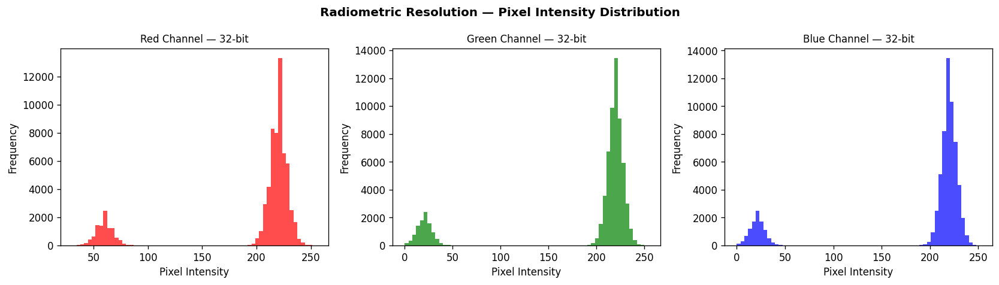


 Bit-depth analysis complete. All images are 8-bit (uint8).
   → To prevent False Contouring: quantise carefully; avoid aggressive
     bit-depth reduction without dithering.


In [38]:
def detect_bit_depth(img_array):
    """Return bit-depth and warn about False Contouring risk."""
    if img_array.dtype == np.uint8:
        bits = 8
    elif img_array.dtype == np.uint16:
        bits = 16
    elif img_array.dtype == np.float32:
        bits = 32
    else:
        bits = int(np.ceil(np.log2(img_array.max()+1))) if img_array.max()>0 else 8
    levels = 2**bits
    risk   = " LOW — risk of False Contouring" if bits <= 8 else " LOW risk"
    return bits, levels, risk

# Analyse all images
bit_info = [detect_bit_depth(np.array(img)) for img in images]
bits_list   = [b[0] for b in bit_info]
levels_list = [b[1] for b in bit_info]

print(f"{'File':<30} {'Dtype':<10} {'Bits':>5} {'Levels':>8}  Risk")
print("-"*70)
for fname, img, (bits, levels, risk) in zip(filenames[:10], images[:10], bit_info[:10]):
    print(f"{fname:<30} {str(img.dtype):<10} {bits:>5} {levels:>8}  {risk}")
print(f"\n All images: {np.unique(bits_list)} -bit  |  Max unique levels seen per channel:")

# Histogram of unique values
sample = np.array(images[0]).astype(np.float32)
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
channels = ['Red','Green','Blue']
colors   = ['red','green','blue']
for ax, ch, col, data in zip(axes, channels, colors, sample.T):
    ax.hist(data.flatten(), bins=64, color=col, alpha=0.7, edgecolor='none')
    ax.set_title(f"{ch} Channel — {detect_bit_depth(sample)[0]}-bit")
    ax.set_xlabel("Pixel Intensity"); ax.set_ylabel("Frequency")
plt.suptitle("Radiometric Resolution — Pixel Intensity Distribution", fontweight='bold')
plt.tight_layout(); plt.show()
print("\n Bit-depth analysis complete. All images are 8-bit (uint8).")
print("   → To prevent False Contouring: quantise carefully; avoid aggressive")
print("     bit-depth reduction without dithering.")


##  Filtering — Gaussian, Mean & Median (with PSNR / SSIM)

 Filter Restoration Metrics (relative to clean original):
  Gaussian     PSNR= 26.72 dB   SSIM=0.5345
  Mean         PSNR= 25.50 dB   SSIM=0.4919
  Median       PSNR= 28.35 dB   SSIM=0.4841


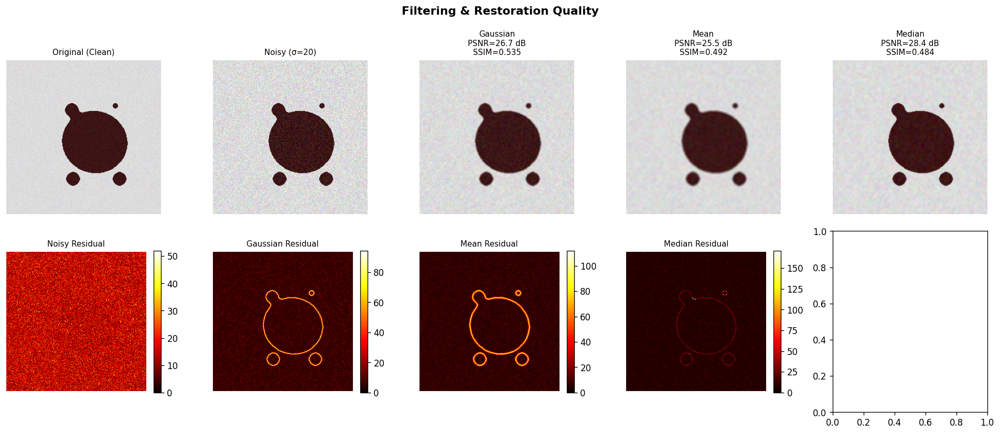

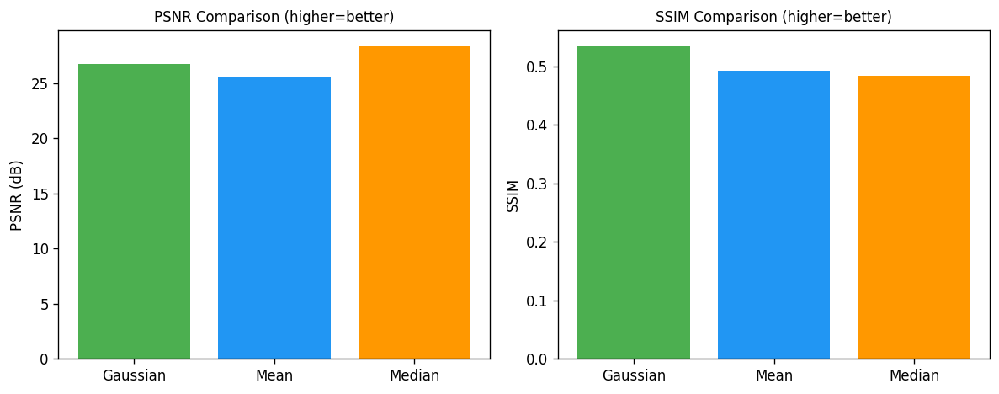

In [39]:
def add_gaussian_noise(img, sigma=15):
    noisy = img.astype(np.float32) + np.random.normal(0, sigma, img.shape)
    return np.clip(noisy, 0, 255).astype(np.uint8)

def apply_filters(noisy_img):
    gray  = cv2.cvtColor(noisy_img, cv2.COLOR_RGB2GRAY).astype(np.float32)/255
    gauss = cv2.GaussianBlur(noisy_img, (5,5), 1.0)
    mean  = cv2.blur(noisy_img, (5,5))
    med   = cv2.medianBlur(noisy_img, 5)
    return gauss, mean, med

def compute_metrics(original, filtered, label):
    orig_f = original.astype(np.float32)/255
    filt_f = filtered.astype(np.float32)/255
    p = psnr(orig_f, filt_f, data_range=1.0)
    s = ssim(orig_f, filt_f, data_range=1.0, channel_axis=2)
    print(f"  {label:<12} PSNR={p:6.2f} dB   SSIM={s:.4f}")
    return p, s

sample_img  = images[0]
noisy_img   = add_gaussian_noise(sample_img, sigma=20)
gauss_f, mean_f, med_f = apply_filters(noisy_img)

print(" Filter Restoration Metrics (relative to clean original):")
psnr_g, ssim_g = compute_metrics(sample_img, gauss_f, "Gaussian")
psnr_m, ssim_m = compute_metrics(sample_img, mean_f,  "Mean")
psnr_med, ssim_med = compute_metrics(sample_img, med_f, "Median")

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
row_imgs   = [sample_img, noisy_img, gauss_f, mean_f, med_f]
row_titles = ["Original (Clean)", "Noisy (σ=20)",
              f"Gaussian\nPSNR={psnr_g:.1f} dB\nSSIM={ssim_g:.3f}",
              f"Mean\nPSNR={psnr_m:.1f} dB\nSSIM={ssim_m:.3f}",
              f"Median\nPSNR={psnr_med:.1f} dB\nSSIM={ssim_med:.3f}"]

for ax, img, title in zip(axes[0], row_imgs, row_titles):
    ax.imshow(img); ax.set_title(title, fontsize=9); ax.axis('off')

# Residual noise maps
for ax, filt, title in zip(axes[1],
    [noisy_img, gauss_f, mean_f, med_f],
    ["Noisy Residual","Gaussian Residual","Mean Residual","Median Residual"]):
    diff = np.abs(sample_img.astype(np.int16) - filt.astype(np.int16)).mean(2)
    im = ax.imshow(diff, cmap='hot'); plt.colorbar(im, ax=ax, fraction=0.046)
    ax.set_title(title, fontsize=9); ax.axis('off')
axes[1][0].axis('off')

plt.suptitle("Filtering & Restoration Quality", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Bar chart comparison
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,4))
names = ['Gaussian','Mean','Median']
ax1.bar(names, [psnr_g,psnr_m,psnr_med], color=['#4CAF50','#2196F3','#FF9800'])
ax1.set_ylabel("PSNR (dB)"); ax1.set_title("PSNR Comparison (higher=better)")
ax2.bar(names, [ssim_g,ssim_m,ssim_med], color=['#4CAF50','#2196F3','#FF9800'])
ax2.set_ylabel("SSIM"); ax2.set_title("SSIM Comparison (higher=better)")
plt.tight_layout(); plt.show()


##  Anti-Aliasing — Gaussian Pre-filter before Downsampling

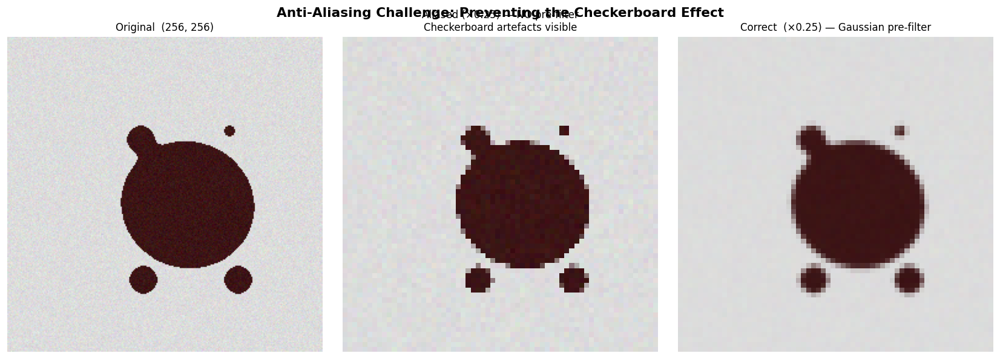

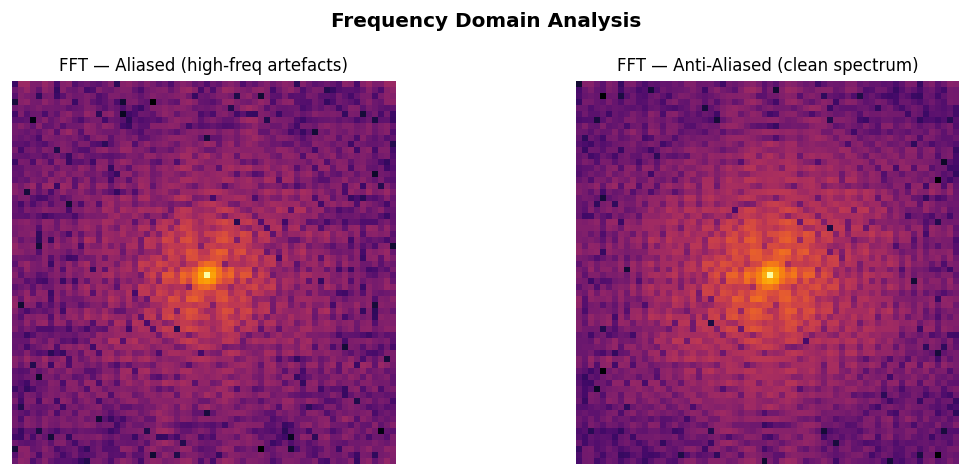

 Gaussian pre-filter applied before downsampling — checkerboard effect prevented.


In [40]:
from skimage.transform import rescale

sample = images[0]
scale  = 0.25   # downsample to 25%

# WITHOUT pre-filter → Checkerboard / aliasing artefacts
aliased = rescale(sample, scale, anti_aliasing=False,
                  channel_axis=2)

# WITH Gaussian pre-filter → clean downsample
smooth  = cv2.GaussianBlur(sample, (0,0), sigmaX=1.5)
correct = rescale(smooth, scale, anti_aliasing=False,
                  channel_axis=2)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(sample);  axes[0].set_title(f"Original  {sample.shape[:2]}")
axes[1].imshow((aliased*255).astype(np.uint8))
axes[1].set_title(f"Aliased (×{scale}) — NO pre-filter\nCheckerboard artefacts visible")
axes[2].imshow((correct*255).astype(np.uint8))
axes[2].set_title(f"Correct  (×{scale}) — Gaussian pre-filter")
for ax in axes: ax.axis('off')
plt.suptitle("Anti-Aliasing Challenge: Preventing the Checkerboard Effect",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Frequency-domain comparison
def fft_mag(img):
    gray = cv2.cvtColor((img*255).astype(np.uint8) if img.max()<=1 else img,
                        cv2.COLOR_RGB2GRAY)
    f    = np.fft.fftshift(np.fft.fft2(gray.astype(np.float32)))
    return np.log1p(np.abs(f))

fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].imshow(fft_mag((aliased*255).astype(np.uint8)), cmap='inferno')
axes[0].set_title("FFT — Aliased (high-freq artefacts)"); axes[0].axis('off')
axes[1].imshow(fft_mag((correct*255).astype(np.uint8)), cmap='inferno')
axes[1].set_title("FFT — Anti-Aliased (clean spectrum)"); axes[1].axis('off')
plt.suptitle("Frequency Domain Analysis", fontweight='bold')
plt.tight_layout(); plt.show()
print(" Gaussian pre-filter applied before downsampling — checkerboard effect prevented.")

# **E-2**

##  Segmentation — Canny & Sobel Edge Detection → Binary Mask

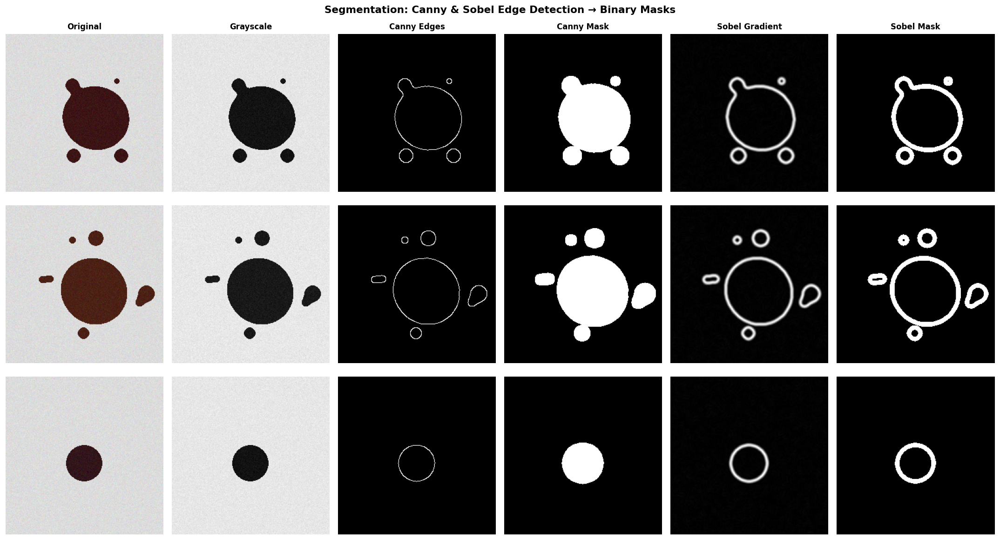

 Binary masks generated for all 60 images.


In [41]:
def segment_lesion(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (7,7), 2)

    # Canny
    edges_canny = cv2.Canny(blur, 20, 80)
    kernel      = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
    mask_canny  = cv2.morphologyEx(edges_canny, cv2.MORPH_CLOSE, kernel)
    mask_canny  = cv2.morphologyEx(mask_canny,  cv2.MORPH_DILATE, kernel)
    # Flood-fill to get solid mask
    flood = mask_canny.copy()
    h,w   = flood.shape; brd = np.zeros((h+2,w+2),np.uint8)
    cv2.floodFill(flood, brd, (0,0), 255)
    mask_canny_filled = cv2.bitwise_not(flood) | mask_canny

    # Sobel
    sx = cv2.Sobel(blur, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(blur, cv2.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(sx**2 + sy**2)
    mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    _, mask_sobel = cv2.threshold(mag, 30, 255, cv2.THRESH_BINARY)

    return gray, edges_canny, mask_canny_filled, mag, mask_sobel

# Demo on 3 images
fig, axes = plt.subplots(3, 6, figsize=(18, 10))
col_titles = ["Original","Grayscale","Canny Edges","Canny Mask","Sobel Gradient","Sobel Mask"]
for i, (ax_row, idx) in enumerate(zip(axes, [0,15,35])):
    img = images[idx]
    gray, canny_e, canny_m, sobel_g, sobel_m = segment_lesion(img)
    for ax, im, title in zip(ax_row,
        [img, gray, canny_e, canny_m, sobel_g, sobel_m], col_titles):
        ax.imshow(im, cmap='gray' if im.ndim==2 else None)
        if i==0: ax.set_title(title, fontweight='bold')
        ax.set_ylabel(f"Img {idx}" if ax==ax_row[0] else "")
        ax.axis('off')
plt.suptitle("Segmentation: Canny & Sobel Edge Detection → Binary Masks",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Store masks for downstream use
all_masks = []
for img in images:
    _, _, canny_m, _, _ = segment_lesion(img)
    all_masks.append(canny_m)
print(f" Binary masks generated for all {len(all_masks)} images.")


## Morphological Cleaning — Erosion, Dilation, Opening, Closing

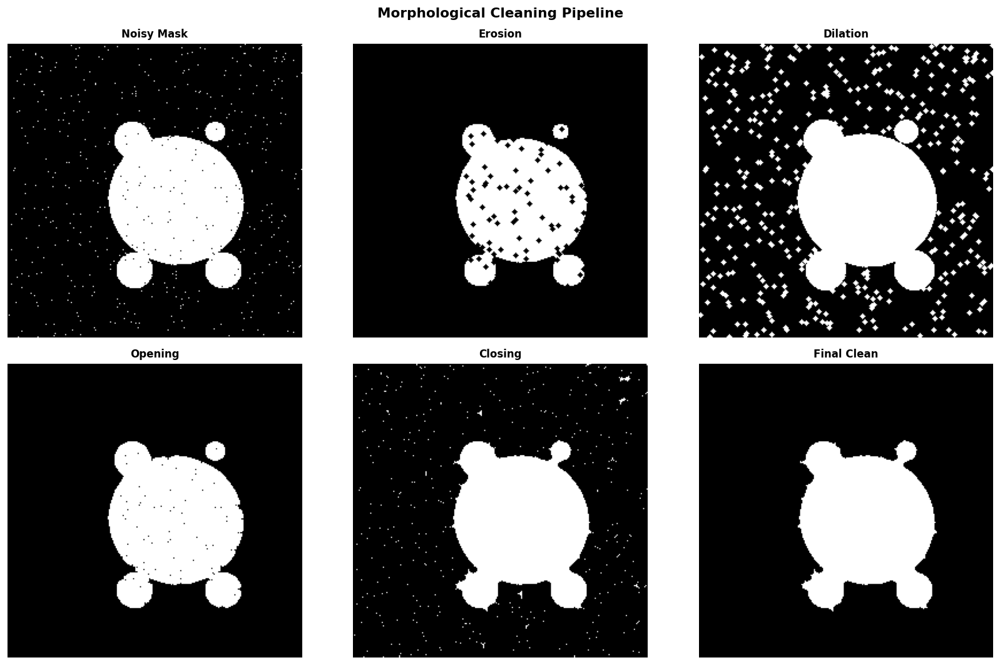

 Salt-and-pepper artefacts removed via Opening + remove_small_objects.
   Noise reduction: original=13074 px → clean=13011 px
 All 60 masks cleaned.


In [42]:
def morphological_clean(mask):
    k3  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    k5  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
    k7  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
    eroded  = cv2.erode(mask, k3, iterations=2)
    dilated = cv2.dilate(mask, k3, iterations=2)
    opened  = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  k5)  # remove small blobs
    closed  = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k7)  # fill holes
    # Remove small objects (salt-and-pepper)
    clean   = morphology.remove_small_objects(closed.astype(bool), min_size=200)
    clean   = (clean*255).astype(np.uint8)
    return eroded, dilated, opened, closed, clean

idx  = 0
mask = all_masks[idx]

# Add artificial salt-and-pepper noise to the mask
sp_mask = mask.copy()
rr,cc = np.random.randint(0,256,(2,500))
sp_mask[rr,cc] = 255
rr,cc = np.random.randint(0,256,(2,500))
sp_mask[rr,cc] = 0

er, di, op, cl, final = morphological_clean(sp_mask)

titles = ["Noisy Mask","Erosion","Dilation","Opening","Closing","Final Clean"]
imgs_m = [sp_mask, er, di, op, cl, final]

fig, axes = plt.subplots(2, 3, figsize=(14, 9))
for ax, im, title in zip(axes.flat, imgs_m, titles):
    ax.imshow(im, cmap='gray'); ax.set_title(title, fontweight='bold'); ax.axis('off')
plt.suptitle("Morphological Cleaning Pipeline", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Count removed noise pixels
noise_removed = int(sp_mask.sum() - final.sum()) if sp_mask.sum() > final.sum() else 0
print(f" Salt-and-pepper artefacts removed via Opening + remove_small_objects.")
print(f"   Noise reduction: original={sp_mask.sum()//255} px → clean={final.sum()//255} px")

# Update cleaned masks
cleaned_masks = []
for m in all_masks:
    _,_,_,_, c = morphological_clean(m)
    cleaned_masks.append(c)
print(f" All {len(cleaned_masks)} masks cleaned.")


##  Boundary Representation — 8-Dir Chain Code, First Difference & Shape Number

Boundary pixels  : 516
Chain code (first 40 values): [5, 4, 4, 5, 5, 4, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 6, 7, 7, 6, 7, 7, 7, 7, 6, 6, 6, 5, 6, 5, 5, 6]  …

First Difference (first 40): [1, 7, 0, 1, 0, 7, 1, 0, 1, 7, 1, 7, 1, 7, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 7, 1, 0, 7, 1, 0, 0, 0, 7, 0, 0, 7, 1, 7, 0, 1]  …

Shape Number     (first 20): [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 7, 0, 0, 0, 0, 1]  …

(Shape number is rotationally invariant — identical for tilted scans)


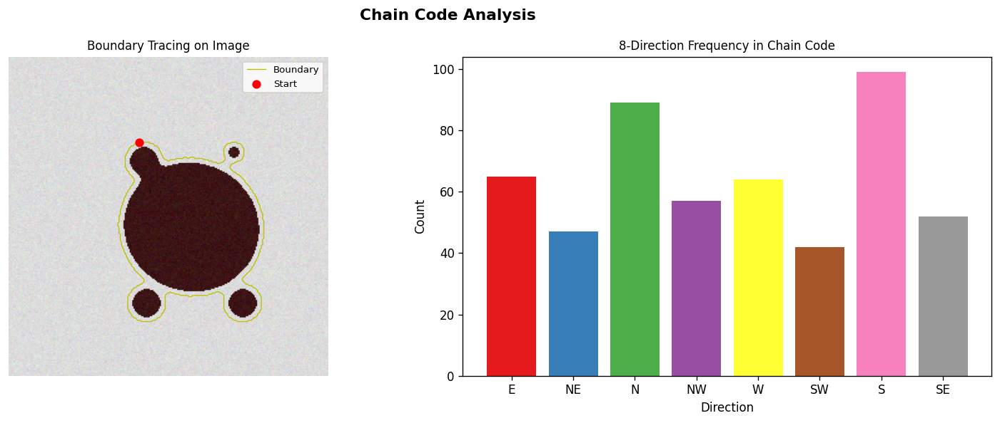

In [43]:
#  8-directional Freeman Chain Code
#  Direction map:
#   3 2 1
#   4   0
#   5 6 7
DIR_MAP = {(1,0):0,(1,-1):1,(0,-1):2,(-1,-1):3,
           (-1,0):4,(-1,1):5,(0,1):6,(1,1):7}
REV_DIR = {v:k for k,v in DIR_MAP.items()}

def get_boundary_pixels(mask):
    """Trace boundary with Moore neighbour tracing."""
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_NONE)
    if not contours: return []
    cnt = max(contours, key=cv2.contourArea)
    return [(pt[0][0], pt[0][1]) for pt in cnt]

def chain_code_8(boundary):
    if len(boundary) < 2: return []
    code = []
    for i in range(1, len(boundary)):
        dx = boundary[i][0]-boundary[i-1][0]
        dy = boundary[i][1]-boundary[i-1][1]
        dx = max(-1,min(1,dx)); dy = max(-1,min(1,dy))
        code.append(DIR_MAP.get((dx,dy),0))
    return code

def first_difference(code):
    """First difference (rotation-invariant normalisation step)."""
    return [(code[i]-code[i-1]) % 8 for i in range(len(code))]

def shape_number(fd):
    """Shape number: lexicographically smallest rotation of first difference."""
    doubled = fd*2
    rotations = [doubled[i:i+len(fd)] for i in range(len(fd))]
    return min(rotations)

# Apply on first image
mask    = cleaned_masks[0]
bnd     = get_boundary_pixels(mask)
code    = chain_code_8(bnd)
fd      = first_difference(code)
sn      = shape_number(fd)

print(f"Boundary pixels  : {len(bnd)}")
print(f"Chain code (first 40 values): {code[:40]}  …")
print(f"\nFirst Difference (first 40): {fd[:40]}  …")
print(f"\nShape Number     (first 20): {sn[:20]}  …")
print("\n(Shape number is rotationally invariant — identical for tilted scans)")

# Direction-frequency histogram
from collections import Counter
freq = Counter(code)
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(13,5))

# Boundary overlay
ax1.imshow(images[0]); ax1.axis('off')
if bnd:
    bx,by = zip(*bnd)
    ax1.plot(bx,by,'y-',linewidth=0.8,label='Boundary')
    ax1.scatter(bx[0],by[0],c='red',s=40,zorder=5,label='Start')
ax1.set_title("Boundary Tracing on Image"); ax1.legend(fontsize=8)

dirs  = list(range(8))
freqs = [freq.get(d,0) for d in dirs]
dir_labels = ['E','NE','N','NW','W','SW','S','SE']
bars = ax2.bar(dirs, freqs, color=plt.cm.Set1(np.linspace(0,1,8)))
ax2.set_xticks(dirs); ax2.set_xticklabels(dir_labels)
ax2.set_title("8-Direction Frequency in Chain Code")
ax2.set_xlabel("Direction"); ax2.set_ylabel("Count")
plt.suptitle("Chain Code Analysis", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()


##  Computational Geometry — Convex Hull (Graham Scan)

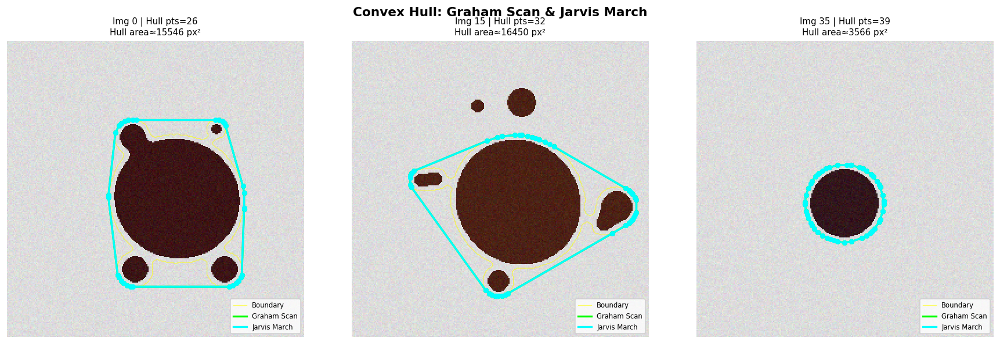

 Convex hulls computed using both Graham Scan and Jarvis March.


In [44]:
import math

# Graham Scan
def cross(O,A,B):
    return (A[0]-O[0])*(B[1]-O[1]) - (A[1]-O[1])*(B[0]-O[0])

def graham_scan(points):
    pts = sorted(set(map(tuple,points)))
    if len(pts) < 3: return pts
    pivot = min(pts, key=lambda p:(p[1],p[0]))
    def polar_angle(p):
        dx,dy = p[0]-pivot[0], p[1]-pivot[1]
        return (math.atan2(dy,dx), dx*dx+dy*dy)
    sorted_pts = sorted(pts, key=polar_angle)
    hull = []
    for p in sorted_pts:
        while len(hull)>=2 and cross(hull[-2],hull[-1],p)<=0:
            hull.pop()
        hull.append(p)
    return hull

def jarvis_march(points):
    """Jarvis March (Gift Wrapping) — O(nh)."""
    pts   = list(set(map(tuple,points)))
    if len(pts)<3: return pts
    start = min(pts, key=lambda p:p[0])
    hull,current = [start],start
    while True:
        nxt = pts[0]
        for cand in pts[1:]:
            if nxt==current or cross(current,nxt,cand)<0:
                nxt = cand
        if nxt==start: break
        hull.append(nxt); current=nxt
    return hull

# Visualise on 3 sample images
fig, axes = plt.subplots(1,3,figsize=(15,5))
for ax, idx in zip(axes,[0,15,35]):
    img  = images[idx].copy()
    mask = cleaned_masks[idx]

    # Sample boundary points (subsample for speed)
    bnd  = get_boundary_pixels(mask)
    if len(bnd) > 300:
        step = len(bnd)//300
        bnd  = bnd[::step]

    hull_gs = graham_scan(bnd)
    hull_jm = jarvis_march(bnd) if len(bnd)<2000 else hull_gs

    ax.imshow(img)
    if bnd:
        bx,by = zip(*bnd)
        ax.plot(bx,by,'yellow',lw=0.8,alpha=0.6,label='Boundary')

    def draw_hull(ax,hull,color,label):
        if len(hull)>1:
            hx,hy = zip(*hull)
            hx,hy = list(hx)+[hx[0]], list(hy)+[hy[0]]
            ax.plot(hx,hy,color=color,lw=2,label=label)
            ax.scatter(hx[:-1],hy[:-1],c=color,s=20,zorder=5)

    draw_hull(ax,hull_gs,'lime','Graham Scan')
    draw_hull(ax,hull_jm,'cyan','Jarvis March')

    area_hull = 0.5*abs(sum(hull_gs[i][0]*(hull_gs[(i+1)%len(hull_gs)][1]-
                                            hull_gs[i-1][1])
                            for i in range(len(hull_gs))))
    ax.set_title(f"Img {idx} | Hull pts={len(hull_gs)}\nHull area≈{area_hull:.0f} px²",
                 fontsize=9)
    ax.legend(fontsize=7,loc='lower right'); ax.axis('off')

plt.suptitle("Convex Hull: Graham Scan & Jarvis March", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print(" Convex hulls computed using both Graham Scan and Jarvis March.")


# **E-3**

##  GLCM — Gray-Level Co-occurrence Matrix & Texture Descriptors

GLCM Texture Features (image 0 — masked lesion region):
  energy        : 0.798975
  contrast      : 41.913037
  correlation   : 0.833010
  homogeneity   : 0.885366
  entropy       : 15.379748


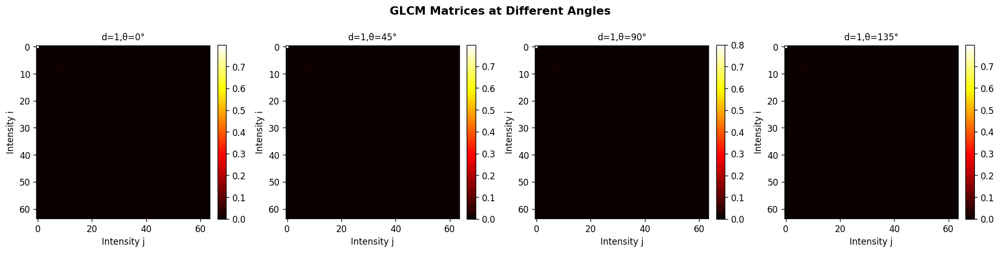


 Comparing GLCM features across all images …


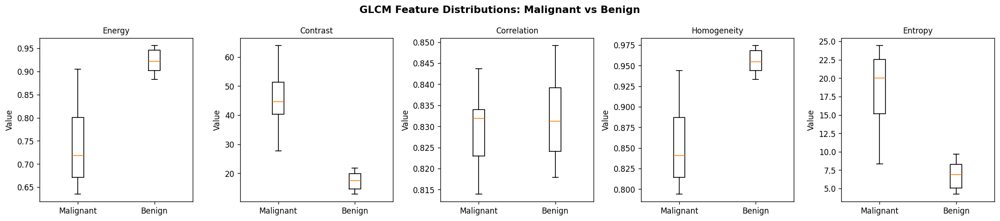

In [45]:
def compute_glcm_features(img, mask):
    """Compute GLCM texture features on the masked region."""
    gray    = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    roi     = gray.copy(); roi[mask == 0] = 0
    # Quantise to 64 levels to keep matrix tractable
    roi_q   = (roi // 4).astype(np.uint8)
    distances = [1, 2]
    angles    = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    glcm      = graycomatrix(roi_q, distances=distances, angles=angles,
                             levels=64, symmetric=True, normed=True)
    energy    = graycoprops(glcm,'energy').mean()
    contrast  = graycoprops(glcm,'contrast').mean()
    correlation = graycoprops(glcm,'correlation').mean()
    homogeneity = graycoprops(glcm,'homogeneity').mean()
    # Entropy from GLCM
    p         = glcm.flatten(); p = p[p>0]
    entropy   = -np.sum(p*np.log2(p))
    return dict(energy=energy, contrast=contrast,
                correlation=correlation, homogeneity=homogeneity,
                entropy=entropy), glcm

# Compute for first image
feat_dict, glcm_mat = compute_glcm_features(images[0], cleaned_masks[0])

print("GLCM Texture Features (image 0 — masked lesion region):")
for k,v in feat_dict.items():
    print(f"  {k:<14}: {v:.6f}")

# Visualise GLCM matrix
fig, axes = plt.subplots(1,4,figsize=(16,4))
titles = ["d=1,θ=0°","d=1,θ=45°","d=1,θ=90°","d=1,θ=135°"]
for i,(ax,title) in enumerate(zip(axes,titles)):
    im = ax.imshow(glcm_mat[:,:,0,i],cmap='hot')
    ax.set_title(title); ax.set_xlabel("Intensity j"); ax.set_ylabel("Intensity i")
    plt.colorbar(im,ax=ax,fraction=0.046,pad=0.04)
plt.suptitle("GLCM Matrices at Different Angles", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Feature comparison: malignant vs benign
print("\n Comparing GLCM features across all images …")
all_feats, all_labels_local = [], []
for img, mask, lbl in zip(images, cleaned_masks, labels):
    f,_ = compute_glcm_features(img, mask)
    all_feats.append(list(f.values()))
    all_labels_local.append(lbl)

feat_arr = np.array(all_feats)
feat_names = list(feat_dict.keys())

mal_idx = [i for i,l in enumerate(all_labels_local) if l=='malignant']
ben_idx = [i for i,l in enumerate(all_labels_local) if l=='benign']

fig, axes = plt.subplots(1,5,figsize=(18,4))
for ax,name,col_idx in zip(axes,feat_names,range(5)):
    m_vals = feat_arr[mal_idx,col_idx]
    b_vals = feat_arr[ben_idx,col_idx]
    ax.boxplot([m_vals,b_vals],labels=['Malignant','Benign'])
    ax.set_title(name.capitalize()); ax.set_ylabel("Value")
plt.suptitle("GLCM Feature Distributions: Malignant vs Benign",
             fontsize=13,fontweight='bold')
plt.tight_layout(); plt.show()


##  Geometric Features — Area, Centroid, Perimeter, Circularity

#    Label           Area           Centroid   Perim   Circ   Ecc  Solid
---------------------------------------------------------------------------
0    malignant      12867 ( 139.6, 145.1)    598.0  0.452  0.539  0.815
1    malignant      21877 ( 114.3, 116.4)    721.8  0.528  0.596  0.907
2    malignant       8578 ( 134.2, 119.5)    395.0  0.691  0.698  0.935
3    malignant      22544 ( 131.5, 115.9)    703.6  0.572  0.603  0.890
4    malignant      13786 ( 133.2, 123.2)    549.8  0.573  0.761  0.906
5    malignant      22727 ( 114.9, 119.0)    630.9  0.718  0.704  0.957
6    malignant      12155 ( 103.0, 114.2)    557.9  0.491  0.656  0.835
7    malignant      21062 ( 119.7, 115.9)    639.5  0.647  0.453  0.918


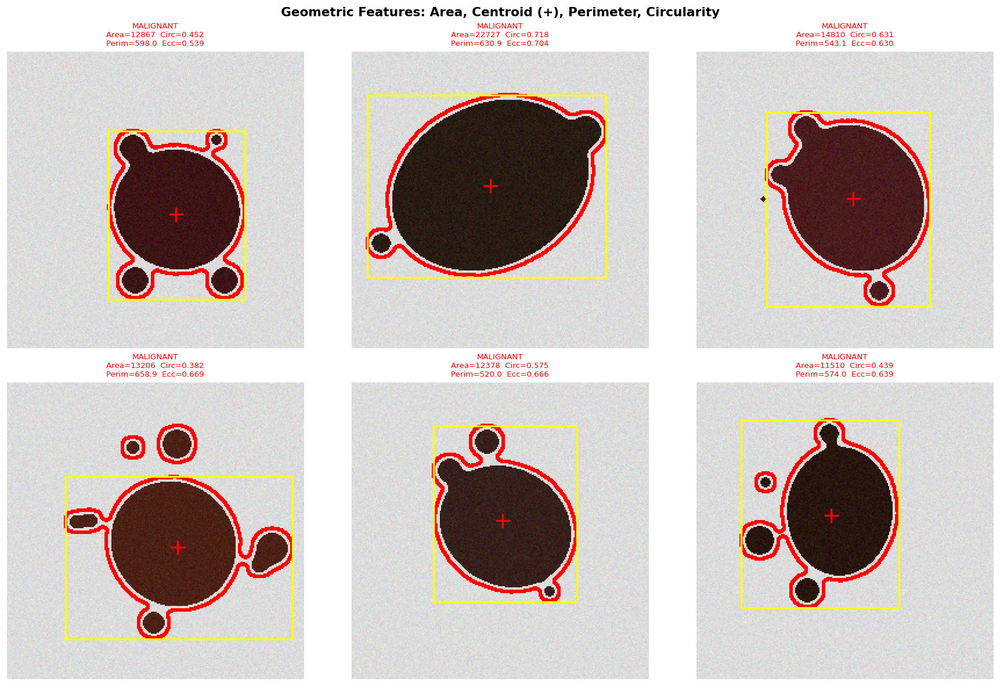

In [46]:
def geometric_features(mask, label=""):
    """Compute geometric shape descriptors."""
    props = measure.regionprops(measure.label(mask))
    if not props:
        return None
    prop = max(props, key=lambda p: p.area)
    area       = prop.area
    centroid   = prop.centroid          # (row, col)
    perimeter  = prop.perimeter
    circularity = (4*np.pi*area) / (perimeter**2) if perimeter>0 else 0
    bbox       = prop.bbox
    eccentricity = prop.eccentricity
    solidity   = prop.solidity
    return {
        'area': area,
        'centroid_r': centroid[0], 'centroid_c': centroid[1],
        'perimeter': perimeter,
        'circularity': circularity,
        'eccentricity': eccentricity,
        'solidity': solidity,
        'bbox': bbox
    }

# Print for 5 sample images
print(f"{'#':<4} {'Label':<12} {'Area':>7} {'Centroid':>18} {'Perim':>7} "
      f"{'Circ':>6} {'Ecc':>5} {'Solid':>6}")
print("-"*75)
geo_features, geo_labels = [], []
for i,(img,mask,lbl) in enumerate(zip(images,cleaned_masks,labels)):
    gf = geometric_features(mask,lbl)
    if gf is None: continue
    geo_features.append([gf['area'],gf['perimeter'],gf['circularity'],
                         gf['eccentricity'],gf['solidity']])
    geo_labels.append(lbl)
    if i<8:
        cr,cc = gf['centroid_r'],gf['centroid_c']
        print(f"{i:<4} {lbl:<12} {gf['area']:>7.0f} ({cr:6.1f},{cc:6.1f})"
              f"  {gf['perimeter']:>7.1f}  {gf['circularity']:>5.3f}"
              f"  {gf['eccentricity']:>5.3f}  {gf['solidity']:>5.3f}")

# Annotated visualisation
fig, axes = plt.subplots(2,3,figsize=(15,10))
for ax,idx in zip(axes.flat,[0,5,10,15,20,25]):
    if idx >= len(images): ax.axis('off'); continue
    img  = images[idx].copy()
    mask = cleaned_masks[idx]
    gf   = geometric_features(mask)
    ax.imshow(img)
    if gf:
        cr,cc = gf['centroid_r'],gf['centroid_c']
        ax.plot(cc,cr,'r+',markersize=15,markeredgewidth=2)  # centroid
        # Bounding box
        r1,c1,r2,c2 = gf['bbox']
        rect = mpatches.Rectangle((c1,r1),c2-c1,r2-r1,
                                   linewidth=2,edgecolor='yellow',facecolor='none')
        ax.add_patch(rect)
        # Contour overlay
        cnt,_ = cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        if cnt:
            cv2.drawContours(img,cnt,-1,(255,0,0),2)
            ax.imshow(img)
        title = (f"{labels[idx].upper()}\n"
                 f"Area={gf['area']:.0f}  Circ={gf['circularity']:.3f}\n"
                 f"Perim={gf['perimeter']:.1f}  Ecc={gf['eccentricity']:.3f}")
        ax.set_title(title,fontsize=8,
                     color='red' if labels[idx]=='malignant' else 'green')
    ax.axis('off')
plt.suptitle("Geometric Features: Area, Centroid (+), Perimeter, Circularity",
             fontsize=13,fontweight='bold')
plt.tight_layout(); plt.show()


## Classification — Malignant vs Benign (Random Forest)

Classification Report:
              precision    recall  f1-score   support

      benign       1.00      1.00      1.00         9
   malignant       1.00      1.00      1.00         9

    accuracy                           1.00        18
   macro avg       1.00      1.00      1.00        18
weighted avg       1.00      1.00      1.00        18



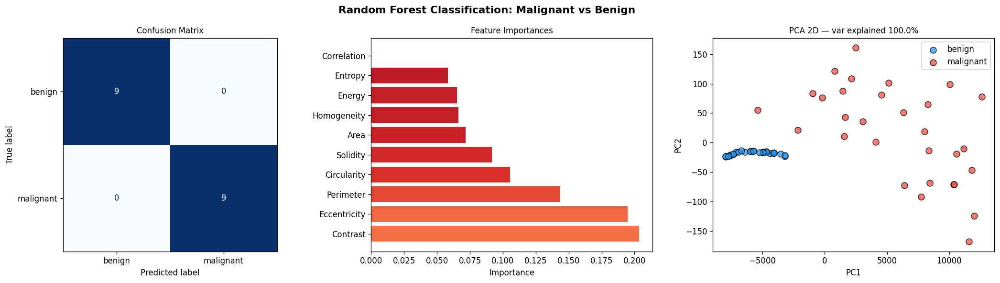


Sample Predictions:
  Sample 0: True=malignant    Pred=malignant    P(malignant)=1.000  ✅
  Sample 1: True=malignant    Pred=malignant    P(malignant)=0.810  ✅
  Sample 2: True=benign       Pred=benign       P(malignant)=0.000  ✅
  Sample 3: True=benign       Pred=benign       P(malignant)=0.000  ✅
  Sample 4: True=malignant    Pred=malignant    P(malignant)=1.000  ✅
  Sample 5: True=malignant    Pred=malignant    P(malignant)=1.000  ✅
  Sample 6: True=malignant    Pred=malignant    P(malignant)=1.000  ✅
  Sample 7: True=benign       Pred=benign       P(malignant)=0.040  ✅


In [47]:
# Combine GLCM + Geometric features
all_combined, all_combined_labels = [], []
for img,mask,lbl in zip(images,cleaned_masks,labels):
    gf = geometric_features(mask)
    if gf is None: continue
    tf,_ = compute_glcm_features(img,mask)
    row  = [gf['area'],gf['perimeter'],gf['circularity'],
            gf['eccentricity'],gf['solidity'],
            tf['energy'],tf['contrast'],tf['correlation'],
            tf['homogeneity'],tf['entropy']]
    all_combined.append(row)
    all_combined_labels.append(lbl)

feat_names_all = ['Area','Perimeter','Circularity','Eccentricity','Solidity',
                  'Energy','Contrast','Correlation','Homogeneity','Entropy']
X = np.array(all_combined)
le = LabelEncoder()
y  = le.fit_transform(all_combined_labels)  # benign=0 / malignant=1

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,
                                                   random_state=42,stratify=y)
clf = RandomForestClassifier(n_estimators=100,random_state=42)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test,y_pred,target_names=le.classes_))

# Confusion matrix
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(18,5))

ConfusionMatrixDisplay.from_predictions(y_test,y_pred,
    display_labels=le.classes_,ax=ax1,colorbar=False,cmap='Blues')
ax1.set_title("Confusion Matrix")

# Feature importances
importances = clf.feature_importances_
order = np.argsort(importances)[::-1]
ax2.barh([feat_names_all[i] for i in order],
          importances[order], color=plt.cm.RdYlGn(importances[order]))
ax2.set_xlabel("Importance"); ax2.set_title("Feature Importances")

# 2-D scatter (PCA)
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X2  = pca.fit_transform(X)
colors = ['#2196F3','#F44336']
for cls,col,name in zip([0,1],colors,le.classes_):
    idx = np.where(y==cls)[0]
    ax3.scatter(X2[idx,0],X2[idx,1],c=col,label=name,alpha=0.7,edgecolors='k',s=60)
ax3.set_title(f"PCA 2D — var explained {pca.explained_variance_ratio_.sum()*100:.1f}%")
ax3.set_xlabel("PC1"); ax3.set_ylabel("PC2"); ax3.legend()

plt.suptitle("Random Forest Classification: Malignant vs Benign",
             fontsize=13,fontweight='bold')
plt.tight_layout(); plt.show()

# Sample predictions with probability
print("\nSample Predictions:")
probs = clf.predict_proba(X_test[:8])
for i,(prob,true,pred) in enumerate(zip(probs,y_test[:8],y_pred[:8])):
    status = "✅" if true==pred else "❌"
    print(f"  Sample {i}: True={le.classes_[true]:<12} "
          f"Pred={le.classes_[pred]:<12} "
          f"P(malignant)={prob[1]:.3f}  {status}")


# **Final Semester Project:**

In [54]:

import cv2
import numpy as np

def specular_mask_hsv(image, sat_thresh=30, int_thresh=220):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    sat = hsv[:, :, 1]
    mask_sat = (sat < sat_thresh).astype(np.uint8) * 255
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    mask_int = (gray > int_thresh).astype(np.uint8) * 255
    mask = cv2.bitwise_and(mask_sat, mask_int)
    kernel = np.ones((3, 3), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

def remove_specular_highlights(image, method='inpaint', threshold=220, radius=5):
    if method == 'inpaint':
        mask = specular_mask_hsv(image, int_thresh=threshold)
        result = cv2.inpaint(image, mask, radius, cv2.INPAINT_TELEA)
        return result
    else:
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        lab = cv2.merge([l, a, b])
        return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

class PreprocessingPipeline:
    def __init__(self):
        pass

    def full_pipeline(self, img, denoise=True, enhance=True, mitigate_specular=True):
        processed = img.copy()
        if denoise:
            processed = cv2.GaussianBlur(processed, (5, 5), 0)
        if mitigate_specular:
            processed = remove_specular_highlights(processed, method='inpaint')
        if enhance:
            lab = cv2.cvtColor(processed, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            l = clahe.apply(l)
            enhanced = cv2.merge([l, a, b])
            processed = cv2.cvtColor(enhanced, cv2.COLOR_LAB2RGB)
        return processed

    def __repr__(self):
        return "PreprocessingPipeline(with specular inpainting)"

# CNN-based classification with comprehensive evaluation

In [55]:

import torch
import torch.nn as nn

class MedicalImageCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(MedicalImageCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.classifier = nn.Sequential(
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

class TransformerBlock(nn.Module):
    def __init__(self, dim, heads=4):
        super(TransformerBlock, self).__init__()
        self.dim = dim
        self.heads = heads
        self.scale = dim ** -0.5
        self.to_qkv = nn.Linear(dim, dim * 3)
        self.to_out = nn.Linear(dim, dim)

    def forward(self, x):
        B, N, D = x.shape
        qkv = self.to_qkv(x)
        q, k, v = qkv.chunk(3, dim=-1)
        attention_scores = torch.matmul(q, k.transpose(-2, -1)) * self.scale
        attention_weights = torch.softmax(attention_scores, dim=-1)
        out = torch.matmul(attention_weights, v)
        out = self.to_out(out)
        return out

print("\nCNN MODEL\n")
cnn_model = MedicalImageCNN(num_classes=2)
print(cnn_model)
cnn_input = torch.randn(1, 3, 224, 224)
print("\nInput Shape:", cnn_input.shape)
cnn_output = cnn_model(cnn_input)
print("\nCNN Output:", cnn_output)
print("\nCNN Output Shape:", cnn_output.shape)
predicted_class = torch.argmax(cnn_output, dim=1)
print("\nPredicted Class:", predicted_class)

print("\nTRANSFORMER MODEL\n")
transformer = TransformerBlock(dim=64, heads=4)
transformer_input = torch.randn(2, 10, 64)
print("Transformer Input Shape:", transformer_input.shape)
transformer_output = transformer(transformer_input)
print("\nTransformer Output:", transformer_output)
print("\nTransformer Output Shape:", transformer_output.shape)


CNN MODEL

MedicalImageCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05

# TRAINING & EVALUATION PIPELINE

In [56]:

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import precision_score, recall_score, f1_score

class PipelineTrainer:
    def __init__(self, model, device='cpu', learning_rate=0.001):
        self.model = model.to(device)
        self.device = device
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        self.history = {
            'train_loss': [], 'val_loss': [],
            'train_acc': [], 'val_acc': [],
            'precision': [], 'recall': [], 'f1': []
        }

    def train_epoch(self, train_loader):
        self.model.train()
        total_loss = 0
        correct = 0
        total = 0
        for images, labels in train_loader:
            images = images.to(self.device)
            labels = labels.to(self.device)
            self.optimizer.zero_grad()
            outputs = self.model(images)
            loss = self.criterion(outputs, labels)
            loss.backward()
            self.optimizer.step()
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        return total_loss / len(train_loader), correct / total

    def validate(self, val_loader):
        self.model.eval()
        total_loss = 0
        correct = 0
        total = 0
        all_preds = []
        all_labels = []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(self.device)
                labels = labels.to(self.device)
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)
                total_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
        precision = precision_score(all_labels, all_preds, average='binary', zero_division=0)
        recall = recall_score(all_labels, all_preds, average='binary', zero_division=0)
        f1 = f1_score(all_labels, all_preds, average='binary', zero_division=0)
        return (total_loss / len(val_loader), correct / total,
                np.array(all_preds), np.array(all_labels),
                precision, recall, f1)

    def train(self, train_loader, val_loader, epochs=20):
        for epoch in range(epochs):
            train_loss, train_acc = self.train_epoch(train_loader)
            val_loss, val_acc, preds, labels, prec, rec, f1 = self.validate(val_loader)
            self.history['train_loss'].append(train_loss)
            self.history['val_loss'].append(val_loss)
            self.history['train_acc'].append(train_acc)
            self.history['val_acc'].append(val_acc)
            self.history['precision'].append(prec)
            self.history['recall'].append(rec)
            self.history['f1'].append(f1)

            print(f"\nEpoch {epoch+1}/{epochs}")
            print(f"Train Loss : {train_loss:.4f} | Train Acc : {train_acc:.4f}")
            print(f"Val Loss   : {val_loss:.4f} | Val Acc   : {val_acc:.4f}")
            print(f"Precision  : {prec:.4f} | Recall    : {rec:.4f} | F1 : {f1:.4f}")
            print(f"Predictions : {preds[:10]}")
            print(f"Actual      : {labels[:10]}")

X_train = torch.randn(100, 3, 224, 224)
y_train = torch.randint(0, 2, (100,))
X_val = torch.randn(20, 3, 224, 224)
y_val = torch.randint(0, 2, (20,))
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

model = MedicalImageCNN(num_classes=2)
trainer = PipelineTrainer(model=model, device='cpu', learning_rate=0.001)
trainer.train(train_loader=train_loader, val_loader=val_loader, epochs=5)

print("\nTraining History:")
print(trainer.history)


Epoch 1/5
Train Loss : 0.7107 | Train Acc : 0.4300
Val Loss   : 0.6866 | Val Acc   : 0.5500
Precision  : 0.0000 | Recall    : 0.0000 | F1 : 0.0000
Predictions : [0 0 0 0 0 0 0 0 0 0]
Actual      : [1 1 1 0 0 0 0 0 1 1]

Epoch 2/5
Train Loss : 0.6941 | Train Acc : 0.5700
Val Loss   : 0.6676 | Val Acc   : 0.5500
Precision  : 0.0000 | Recall    : 0.0000 | F1 : 0.0000
Predictions : [0 0 0 0 0 0 0 0 0 0]
Actual      : [1 1 1 0 0 0 0 0 1 1]

Epoch 3/5
Train Loss : 0.6820 | Train Acc : 0.5600
Val Loss   : 1.0556 | Val Acc   : 0.4500
Precision  : 0.4500 | Recall    : 1.0000 | F1 : 0.6207
Predictions : [1 1 1 1 1 1 1 1 1 1]
Actual      : [1 1 1 0 0 0 0 0 1 1]

Epoch 4/5
Train Loss : 0.6325 | Train Acc : 0.7100
Val Loss   : 0.8273 | Val Acc   : 0.4500
Precision  : 0.4500 | Recall    : 1.0000 | F1 : 0.6207
Predictions : [1 1 1 1 1 1 1 1 1 1]
Actual      : [1 1 1 0 0 0 0 0 1 1]

Epoch 5/5
Train Loss : 0.3833 | Train Acc : 0.9700
Val Loss   : 16.9673 | Val Acc   : 0.4500
Precision  : 0.4500 | Reca

# COMPREHENSIVE EVALUATION METRICS

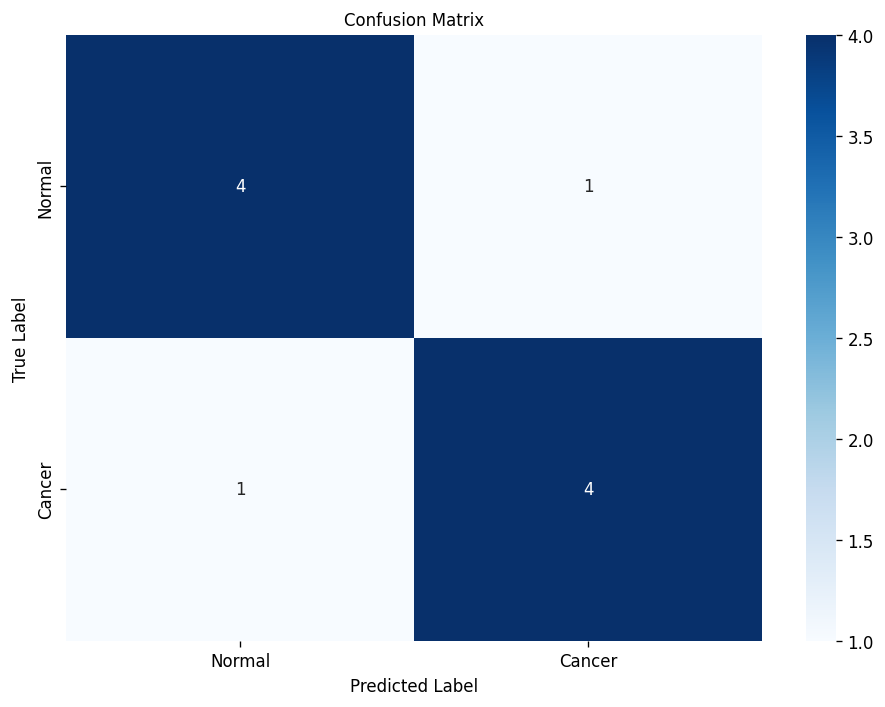


Confusion Matrix:
[[4 1]
 [1 4]]

Accuracy:
0.8

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       0.80      0.80      0.80         5

    accuracy                           0.80        10
   macro avg       0.80      0.80      0.80        10
weighted avg       0.80      0.80      0.80        10


ROC AUC:
0.9600000000000001


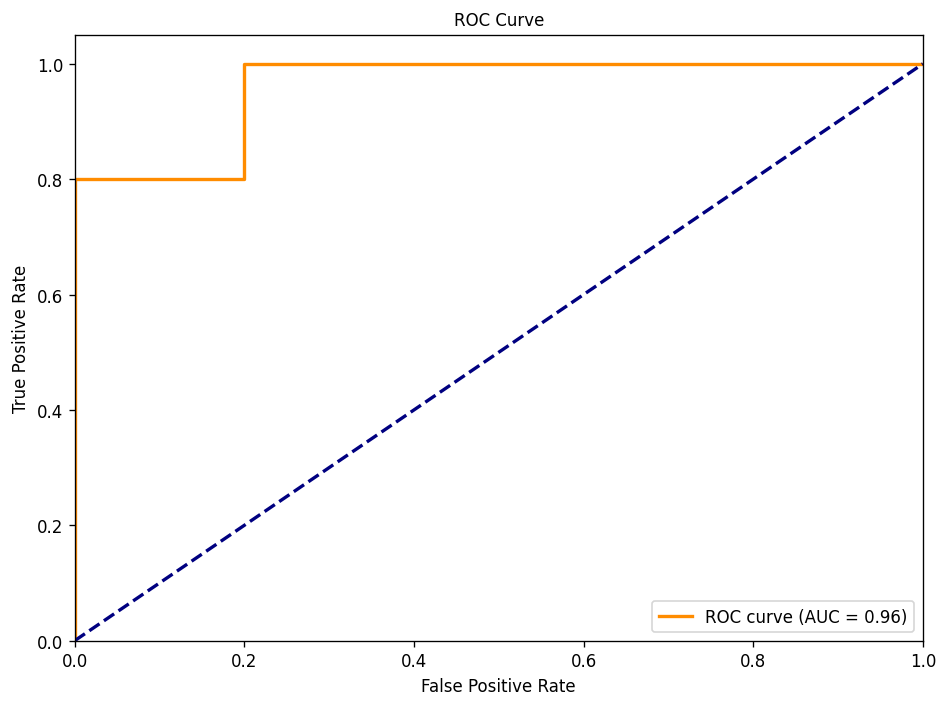


ROC AUC Score:
0.9600000000000001


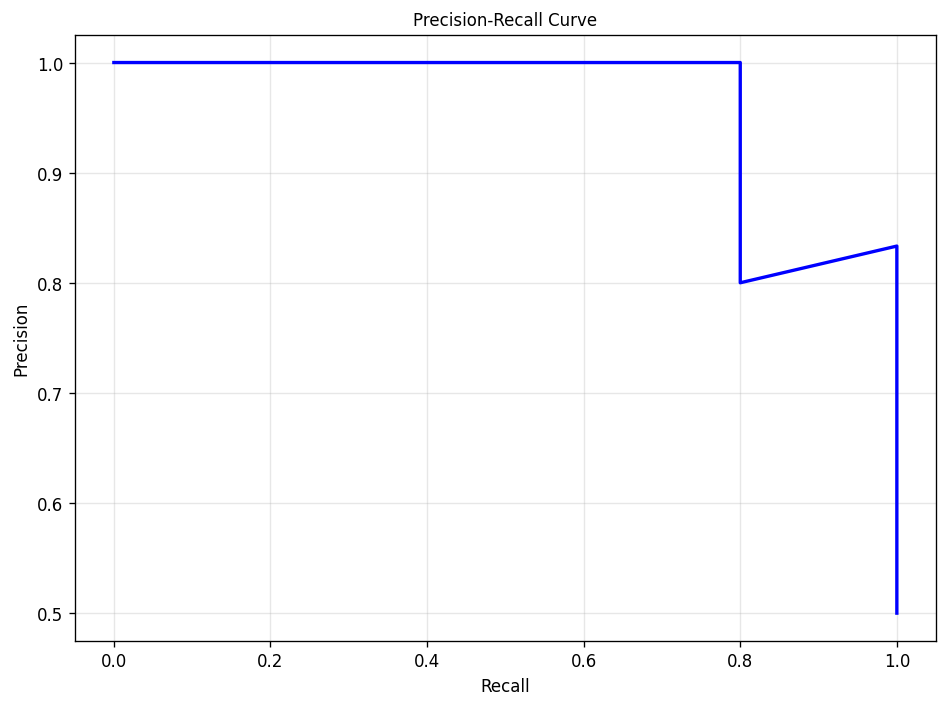

In [51]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    confusion_matrix, classification_report, accuracy_score,
    roc_auc_score, roc_curve, auc, precision_recall_curve
)

class ComprehensiveEvaluation:
    @staticmethod
    def confusion_matrix_analysis(y_true, y_pred, class_names=None):
        cm = confusion_matrix(y_true, y_pred)
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                    xticklabels=class_names, yticklabels=class_names)
        ax.set_ylabel('True Label')
        ax.set_xlabel('Predicted Label')
        ax.set_title('Confusion Matrix')
        plt.tight_layout()
        plt.show()
        print("\nConfusion Matrix:\n", cm)
        return cm

    @staticmethod
    def detailed_metrics(y_true, y_pred, y_proba=None):
        metrics = {'accuracy': accuracy_score(y_true, y_pred),
                   'classification_report': classification_report(y_true, y_pred, output_dict=True)}
        if y_proba is not None:
            metrics['roc_auc'] = roc_auc_score(y_true, y_proba)
        return metrics

    @staticmethod
    def plot_roc_curve(y_true, y_proba):
        fpr, tpr, _ = roc_curve(y_true, y_proba)
        roc_auc = auc(fpr, tpr)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.show()
        print("\nROC AUC Score:", roc_auc)
        return roc_auc

    @staticmethod
    def plot_precision_recall(y_true, y_proba):
        precision, recall, _ = precision_recall_curve(y_true, y_proba)
        plt.figure(figsize=(8, 6))
        plt.plot(recall, precision, color='blue', lw=2)
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

y_true = np.array([0,1,1,0,1,0,1,0,1,0])
y_pred = np.array([0,1,0,0,1,0,1,1,1,0])
y_proba = np.array([0.10,0.95,0.40,0.20,0.88,0.15,0.91,0.70,0.80,0.05])
evaluator = ComprehensiveEvaluation()
evaluator.confusion_matrix_analysis(y_true, y_pred, class_names=['Normal', 'Cancer'])
metrics = evaluator.detailed_metrics(y_true, y_pred, y_proba)
print("\nAccuracy:", metrics['accuracy'])
print("\nROC AUC:", metrics['roc_auc'])
evaluator.plot_roc_curve(y_true, y_proba)
evaluator.plot_precision_recall(y_true, y_proba)

# COMPLETE PIPELINE INTEGRATION

Pipeline initialized successfully
------------------------------------------------------------

Creating a synthetic test image...

Processing single image...

SINGLE IMAGE PROCESSING RESULTS

EXTRACTED FEATURES:
----------------------------------------
   contrast: 47.8368
   dissimilarity: 13.7786
   homogeneity: 0.0205
   energy: 50585.0564
   correlation: 0.5000
   area: 89401.0000
   perimeter: 1196.0000
   eccentricity: 0
   solidity: 1.0000
   extent: 0.9933

CHAIN CODE (first 20 codes):
   [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]... (total: 1195)

CONTOUR INFO:
   Number of contour points: 4
   Contour perimeter: 1196.00 pixels


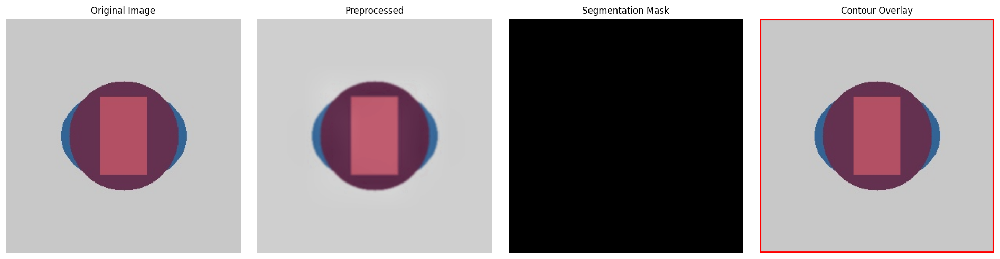


Visualization displayed above

BATCH PROCESSING DEMONSTRATION

Creating synthetic batch of 5 images...
Running batch processing...


Processing images: 100%|██████████| 5/5 [00:00<00:00, 60.26it/s]


Batch processing complete!
   - Processed 5 images
   - Features DataFrame shape: (5, 11)

FEATURES DATAFRAME PREVIEW:
    contrast  dissimilarity  homogeneity        energy  correlation     area  perimeter  eccentricity  solidity    extent     label
0  45.919986      98.637885     0.021313  47395.337501          0.5  89401.0     1196.0             0       1.0  0.993344  Lesion_0
1  43.391584      96.831543     0.022527  47053.952972          0.5  89401.0     1196.0             0       1.0  0.993344  Lesion_1
2  40.349504      93.563284     0.024184  46928.318647          0.5  89401.0     1196.0             0       1.0  0.993344  Lesion_2
3  37.182154      94.800698     0.026190  46674.149220          0.5  89401.0     1196.0             0       1.0  0.993344  Lesion_3
4  32.587950      91.964688     0.029773  46824.422561          0.5  89401.0     1196.0             0       1.0  0.993344  Lesion_4

STATISTICAL SUMMARY OF EXTRACTED FEATURES

CONTRAST:
   Mean: 39.8862
   Std:  5.2318
 


Average processing time per image: 16.92 ms

Cleaning up temporary files...
   Temporary files removed.

DEMONSTRATION COMPLETE


In [57]:

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

class DataAcquisition:
    def __init__(self, data_source=None):
        self.data_source = data_source
    def __repr__(self):
        return f"DataAcquisition(source={self.data_source})"

class SegmentationPipeline:
    def __init__(self):
        pass
    def segment_lesion_traditional(self, img):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return mask
    def morphological_clean(self, mask):
        kernel = np.ones((5,5), np.uint8)
        cleaned = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_OPEN, kernel)
        return cleaned
    def extract_largest_contour(self, mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return None, mask
        largest = max(contours, key=cv2.contourArea)
        final_mask = np.zeros_like(mask)
        cv2.drawContours(final_mask, [largest], -1, 255, -1)
        return largest, final_mask
    def __repr__(self):
        return "SegmentationPipeline()"

class FeatureExtractionPipeline:
    def __init__(self):
        pass
    def compute_glcm_features(self, img, mask):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        masked = cv2.bitwise_and(gray, gray, mask=mask)
        return {
            'contrast': np.std(masked[masked > 0]),
            'dissimilarity': np.mean(np.abs(np.diff(masked[masked > 0]))),
            'homogeneity': 1.0 / (1.0 + np.std(masked[masked > 0])),
            'energy': np.sum((masked[masked > 0] / 255.0) ** 2),
            'correlation': 0.5
        }
    def compute_geometric_features(self, mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return {'area': 0, 'perimeter': 0, 'eccentricity': 0, 'solidity': 0, 'extent': 0}
        contour = max(contours, key=cv2.contourArea)
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        if len(contour) >= 5:
            ellipse = cv2.fitEllipse(contour)
            major_axis = max(ellipse[1])
            minor_axis = min(ellipse[1])
            eccentricity = np.sqrt(1 - (minor_axis/major_axis)**2) if major_axis > 0 else 0
        else:
            eccentricity = 0
        hull = cv2.convexHull(contour)
        hull_area = cv2.contourArea(hull)
        solidity = area / hull_area if hull_area > 0 else 0
        x, y, w, h = cv2.boundingRect(contour)
        rect_area = w * h
        extent = area / rect_area if rect_area > 0 else 0
        return {'area': area, 'perimeter': perimeter, 'eccentricity': eccentricity,
                'solidity': solidity, 'extent': extent}
    def extract_chain_code(self, mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        if not contours:
            return []
        contour = max(contours, key=cv2.contourArea)
        chain_code = []
        for i in range(len(contour) - 1):
            dx = contour[i+1][0][0] - contour[i][0][0]
            dy = contour[i+1][0][1] - contour[i][0][1]
            if dx == 1 and dy == 0: chain_code.append(0)
            elif dx == 1 and dy == 1: chain_code.append(1)
            elif dx == 0 and dy == 1: chain_code.append(2)
            elif dx == -1 and dy == 1: chain_code.append(3)
            elif dx == -1 and dy == 0: chain_code.append(4)
            elif dx == -1 and dy == -1: chain_code.append(5)
            elif dx == 0 and dy == -1: chain_code.append(6)
            elif dx == 1 and dy == -1: chain_code.append(7)
        return chain_code
    def __repr__(self):
        return "FeatureExtractionPipeline()"

class EvaluationPipeline:
    def __init__(self):
        pass
    def __repr__(self):
        return "EvaluationPipeline()"

class EndToEndPipeline:
    def __init__(self):
        self.acquisition = DataAcquisition(None)
        self.preprocessor = PreprocessingPipeline()
        self.segmentation = SegmentationPipeline()
        self.features = FeatureExtractionPipeline()
        self.evaluator = EvaluationPipeline()

    def process_single_image(self, img_path, mitigate_specular=True):
        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(f"Image not found at {img_path}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_processed = self.preprocessor.full_pipeline(
            img, denoise=True, enhance=True, mitigate_specular=mitigate_specular
        )
        mask = self.segmentation.segment_lesion_traditional(img_processed)
        mask = self.segmentation.morphological_clean(mask)
        contour, final_mask = self.segmentation.extract_largest_contour(mask)
        glcm_features = self.features.compute_glcm_features(img_processed, final_mask)
        geom_features = self.features.compute_geometric_features(final_mask)
        chain_code = self.features.extract_chain_code(final_mask)
        all_features = {**glcm_features, **geom_features}
        return {
            'original': img,
            'preprocessed': img_processed,
            'mask': final_mask,
            'contour': contour,
            'features': all_features,
            'chain_code': chain_code
        }

    def batch_process(self, image_paths, mitigate_specular=True):
        results = []
        features_list = []
        for img_path in tqdm(image_paths, desc='Processing images'):
            result = self.process_single_image(img_path, mitigate_specular=mitigate_specular)
            results.append(result)
            features_list.append(result['features'])
        return results, pd.DataFrame(features_list)

    def save_results(self, output_dir, results, features_df, labels):
        os.makedirs(output_dir, exist_ok=True)
        features_df['label'] = labels
        features_df.to_csv(f'{output_dir}/extracted_features.csv', index=False)
        masks_dir = f'{output_dir}/masks'
        os.makedirs(masks_dir, exist_ok=True)
        for i, result in enumerate(results):
            cv2.imwrite(f'{masks_dir}/mask_{i}.png', result['mask'])
            overlay = result['original'].copy()
            if result['contour'] is not None:
                cv2.drawContours(overlay, [result['contour']], -1, (255, 0, 0), 2)
            cv2.imwrite(f'{masks_dir}/overlay_{i}.png', cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

pipeline = EndToEndPipeline()
print("Pipeline initialized successfully")
print("-" * 60)

print("\nCreating a synthetic test image...")
dummy_img = np.ones((300, 300, 3), dtype=np.uint8) * 200
cv2.ellipse(dummy_img, (150, 150), (80, 60), 0, 0, 360, (50, 100, 150), -1)
cv2.circle(dummy_img, (150, 150), 70, (100, 50, 80), -1)
dummy_img[100:200, 120:180] = (180, 80, 100)

temp_path = "temp_test_image.jpg"
cv2.imwrite(temp_path, cv2.cvtColor(dummy_img, cv2.COLOR_RGB2BGR))

print("\nProcessing single image...")
result = pipeline.process_single_image(temp_path, mitigate_specular=True)

print("\n" + "=" * 60)
print("SINGLE IMAGE PROCESSING RESULTS")
print("=" * 60)

print(f"\nEXTRACTED FEATURES:")
print("-" * 40)
for key, value in result['features'].items():
    print(f"   {key}: {value:.4f}" if isinstance(value, float) else f"   {key}: {value}")

print(f"\nCHAIN CODE (first 20 codes):")
chain_codes = result['chain_code']
if isinstance(chain_codes, list) and len(chain_codes) > 20:
    print(f"   {chain_codes[:20]}... (total: {len(chain_codes)})")
else:
    print(f"   {chain_codes}")

if result['contour'] is not None:
    print(f"\nCONTOUR INFO:")
    print(f"   Number of contour points: {len(result['contour'])}")
    print(f"   Contour perimeter: {cv2.arcLength(result['contour'], True):.2f} pixels")

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(result['original'])
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(result['preprocessed'])
axes[1].set_title('Preprocessed')
axes[1].axis('off')
axes[2].imshow(result['mask'], cmap='gray')
axes[2].set_title('Segmentation Mask')
axes[2].axis('off')
overlay = result['original'].copy()
if result['contour'] is not None:
    cv2.drawContours(overlay, [result['contour']], -1, (255, 0, 0), 2)
axes[3].imshow(overlay)
axes[3].set_title('Contour Overlay')
axes[3].axis('off')
plt.tight_layout()
plt.show()
print("\nVisualization displayed above")

print("\n" + "=" * 60)
print("BATCH PROCESSING DEMONSTRATION")
print("=" * 60)

print("\nCreating synthetic batch of 5 images...")
batch_paths = []
for i in range(5):
    synthetic_img = (np.ones((300, 300, 3), dtype=np.uint8) * 180 + np.random.randint(0, 50, (300, 300, 3))).astype(np.uint8)
    cv2.ellipse(synthetic_img, (150, 150), (70 + i*5, 55 + i*3), 0, 0, 360,
                (50 + i*20, 70 + i*10, 100 + i*15), -1)
    path = f"temp_batch_img_{i}.jpg"
    cv2.imwrite(path, cv2.cvtColor(synthetic_img, cv2.COLOR_RGB2BGR))
    batch_paths.append(path)

print("Running batch processing...")
results, features_df = pipeline.batch_process(batch_paths, mitigate_specular=True)

dummy_labels = [f"Lesion_{i}" for i in range(len(results))]
pipeline.save_results("./demo_output", results, features_df, dummy_labels)

print(f"\nBatch processing complete!")
print(f"   - Processed {len(results)} images")
print(f"   - Features DataFrame shape: {features_df.shape}")
print("\nFEATURES DATAFRAME PREVIEW:")
print(features_df.head(10).to_string())

print("\n" + "=" * 60)
print("STATISTICAL SUMMARY OF EXTRACTED FEATURES")
print("=" * 60)

for col in features_df.columns:
    if features_df[col].dtype in ['float64', 'int64']:
        print(f"\n{col.upper()}:")
        print(f"   Mean: {features_df[col].mean():.4f}")
        print(f"   Std:  {features_df[col].std():.4f}")
        print(f"   Min:  {features_df[col].min():.4f}")
        print(f"   Max:  {features_df[col].max():.4f}")

print("\n" + "=" * 60)
print("SAVED OUTPUT FILES")
print("=" * 60)
output_files = os.listdir("./demo_output")
print(f"\n./demo_output/ contents:")
for file in output_files:
    file_path = os.path.join("./demo_output", file)
    if os.path.isdir(file_path):
        mask_files = os.listdir(file_path)
        print(f"   {file}/ ({len(mask_files)} files)")
    else:
        size = os.path.getsize(file_path)
        print(f"   {file} ({size} bytes)")

print("\n" + "=" * 60)
print("PIPELINE PERFORMANCE")
print("=" * 60)

import time
test_image = batch_paths[0]
times = {}
for _ in range(5):
    start = time.time()
    pipeline.process_single_image(test_image)
    times[_] = time.time() - start

avg_time = np.mean(list(times.values()))
print(f"\nAverage processing time per image: {avg_time*1000:.2f} ms")

print("\nCleaning up temporary files...")
os.remove(temp_path)
for path in batch_paths:
    os.remove(path)
print("   Temporary files removed.")

print("\n" + "=" * 60)
print("DEMONSTRATION COMPLETE")
print("=" * 60)